In [34]:
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.svm import SVC
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, ConfusionMatrixDisplay
from sklearn.model_selection import cross_val_score, GridSearchCV
from sklearn.inspection import DecisionBoundaryDisplay
from sklearn import preprocessing
from sklearn.model_selection import KFold

import warnings
warnings.filterwarnings('ignore')

# SVM для задач классификации

## Useful functions

In [6]:
def plot_graph_with_metrics(dataset):

    X = dataset.iloc[::, :-1:]
    y = dataset.iloc[::, -1::]
    X = X.to_numpy()
    y = y.to_numpy().flatten()
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8)
    target_names = list(map(str, np.unique(y)))
    
    models = (
        SVC(kernel='linear', C=0.1), SVC(kernel='linear', C=1), SVC(kernel='linear', C=10),
        SVC(kernel='poly', gamma = 0.1, C=0.1), #SVC(kernel='poly', gamma = 1, C=0.1), SVC(kernel='poly', gamma = 10, C=0.1),
        SVC(kernel='poly', gamma = 0.1, C=1), #SVC(kernel='poly', gamma = 1, C=1), SVC(kernel='poly', gamma = 10, C=1),
        SVC(kernel='poly', gamma = 0.1, C=10), #SVC(kernel='poly', gamma = 1, C=10), SVC(kernel='poly', gamma = 10, C=10),
        SVC(kernel='rbf', gamma = 0.1, C=0.1), SVC(kernel='rbf', gamma = 1, C=0.1), SVC(kernel='rbf', gamma = 10, C=0.1),
        SVC(kernel='rbf', gamma = 0.1, C=1), SVC(kernel='rbf', gamma = 1, C=1), SVC(kernel='rbf', gamma = 10, C=1),
        SVC(kernel='rbf', gamma = 0.1, C=10), SVC(kernel='rbf', gamma = 1, C=10), SVC(kernel='rbf', gamma = 10, C=10),
        SVC(kernel='sigmoid', gamma = 0.1, C=0.1), SVC(kernel='sigmoid', gamma = 1, C=0.1), SVC(kernel='sigmoid', gamma = 10, C=0.1),
        SVC(kernel='sigmoid', gamma = 0.1, C=1), SVC(kernel='sigmoid', gamma = 1, C=1), SVC(kernel='sigmoid', gamma = 10, C=1),
        SVC(kernel='sigmoid', gamma = 0.1, C=10), SVC(kernel='sigmoid', gamma = 1, C=10), SVC(kernel='sigmoid', gamma = 10, C=10),
    )
    
    models = (clf.fit(X_train, y_train) for clf in models)
    
    titles = (
        "linear, C=0.1", "linear, C=1", "linear, C=10",
        "poly, gamma=0.1, C=0.1", #"poly, gamma=1, C=0.1", "poly, gamma=10, C=0.1",
        "poly, gamma=0.1, C=1", #"poly, gamma=1, C=1", "poly, gamma=10, C=1",
        "poly, gamma=0.1, C=10", #"poly, gamma=1, C=10", "poly, gamma=10, C=10",
        "rbf, gamma=0.1, C=0.1", "rbf, gamma=1, C=0.1", "rbf, gamma=10, C=0.1",
        "rbf, gamma=0.1, C=1", "rbf, gamma=1, C=1", "rbf, gamma=10, C=1",
        "rbf, gamma=0.1, C=10", "rbf, gamma=1, C=10", "rbf, gamma=10, C=10",
        "sigmoid, gamma=0.1, C=0.1", "sigmoid, gamma=1, C=0.1", "sigmoid, gamma=10, C=0.1",
        "sigmoid, gamma=0.1, C=1", "sigmoid, gamma=1, C=1", "sigmoid, gamma=10, C=1",
        "sigmoid, gamma=0.1, C=10", "sigmoid, gamma=1, C=10", "sigmoid, gamma=10, C=10",
    )
    
    
    
    fig, sub = plt.subplots(8, 3, figsize=(14, 40))
    plt.subplots_adjust(wspace=0.2, hspace=1.0)
    
    X0, X1 = X_train[:, 0], X_train[:, 1]
    
    for clf, title, ax in zip(models, titles, sub.flatten()):
        y_pred = clf.predict(X_test)
        report = classification_report(y_test, y_pred, target_names=target_names, output_dict=True)
        
        disp = DecisionBoundaryDisplay.from_estimator(
            clf,
            X_train,
            response_method="predict",
            cmap=plt.cm.coolwarm,
            alpha=0.8,
            ax=ax,
            xlabel="Accuracy: " + str(round(accuracy_score(y_test, y_pred), 2)) + '\n' + '\n'+ str(pd.DataFrame(report).transpose().iloc[:-3:, :-1:].round(2)),
            ylabel='Good model  (:' if accuracy_score(y_test, y_pred) > 0.85 else 'Bad model  ):',
        )
        ax.scatter(X0, X1, c=y_train, cmap=plt.cm.coolwarm, s=20, edgecolors="k")
        ax.set_xticks(())
        ax.set_yticks(())
        ax.set_title(title)
    
    plt.show()

## Dataset: Aggregation

In [7]:
dataset = pd.read_csv('datasets/Aggregation.txt', sep="\t", header=None)

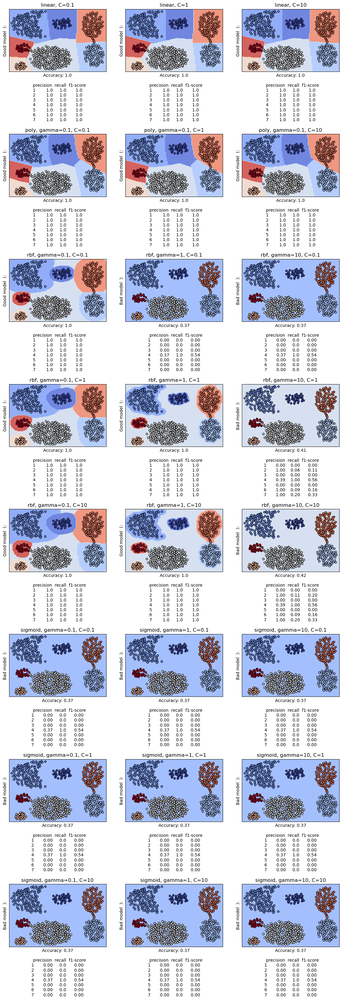

In [8]:
plot_graph_with_metrics(dataset)

Данные линейно раздедимы друг от друга, поэтому модель с линейным ядром при любых значениях параметров работает отлично. Такой же результат показывает и модель с полиномиальным ядром. Модель с ядром rbf при определенно подобранных параметрах также работает хорошо.

## Dataset: Compound

In [11]:
dataset = pd.read_csv('datasets/Compound.txt', sep="\t", header=None)

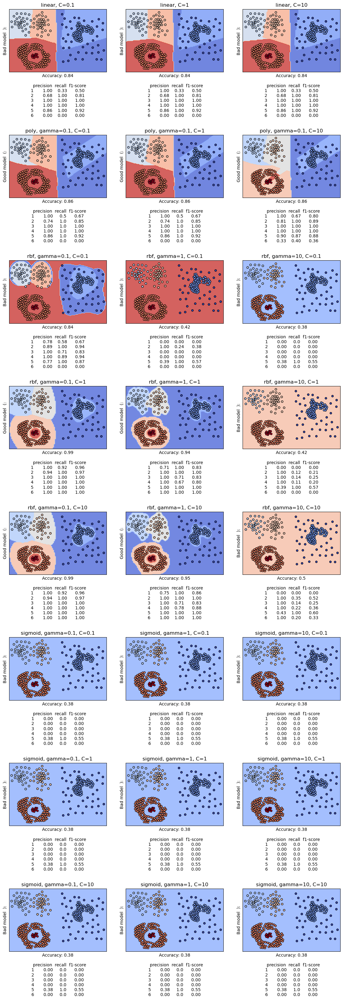

In [12]:
plot_graph_with_metrics(dataset)

В этом датасете некоторые данные остаются линейно разделимыми, но также и появляются данные, которые содержатся друг в друге. Модель с линейным или полиномиальным ядром не способны отличать вложенные данные. Лучший результат здесь показывает модель с ядром rbf.

## Dataset: Pathbased

In [13]:
dataset = pd.read_csv('datasets/pathbased.txt', sep="\t", header=None)

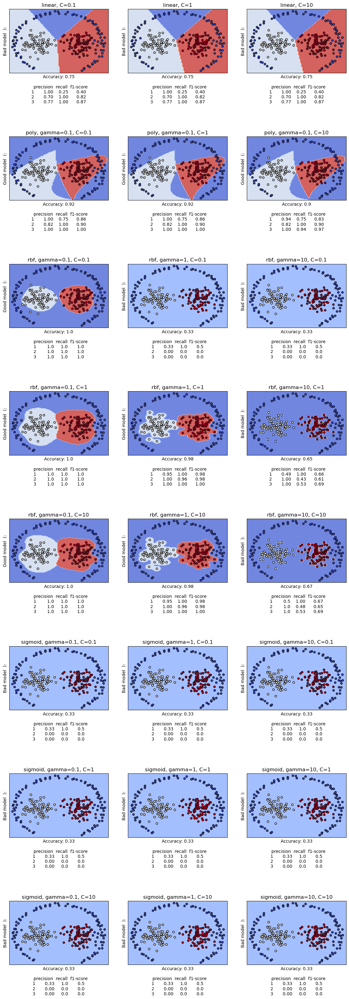

In [14]:
plot_graph_with_metrics(dataset)

Здесь данные имеют вложенную структуры, внутри которой они линейно разделимы. Снова лучше всех работает модель с ядром rbf.

## Dataset: flame

In [15]:
dataset = pd.read_csv('datasets/flame.txt', sep="\t", header=None)

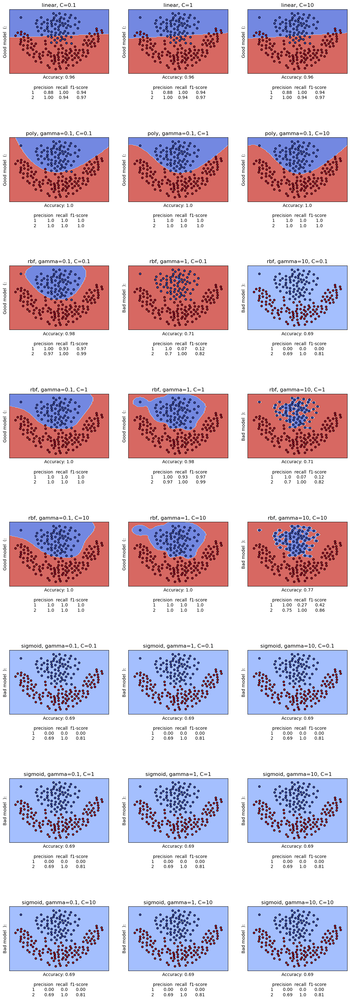

In [16]:
plot_graph_with_metrics(dataset)

Видим, что данные хорошо отделяются как моделью с полиномиальным ядром, так и моделью с ядром rbf.

## Dataset: Jain

In [17]:
dataset = pd.read_csv('datasets/jain.txt', sep="\t", header=None)

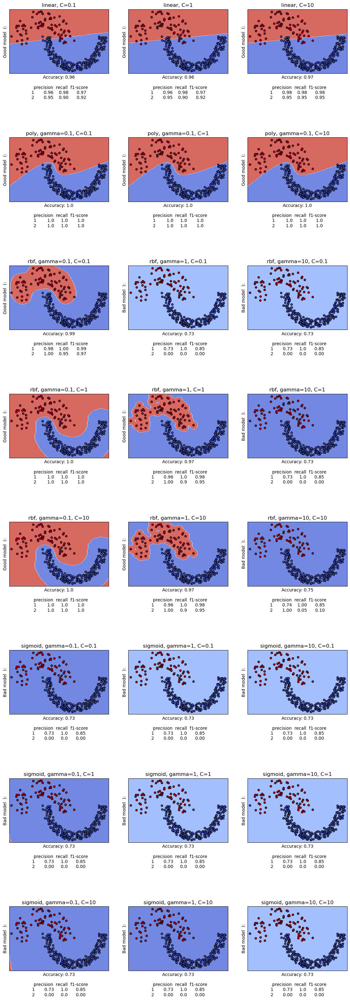

In [18]:
plot_graph_with_metrics(dataset)

Данные также отлично разделимы моделью с полиномиальным ядром и моделью с ядром rbf.

## Dataset: Spiral

In [19]:
dataset = pd.read_csv('datasets/spiral.txt', sep="\t", header=None)

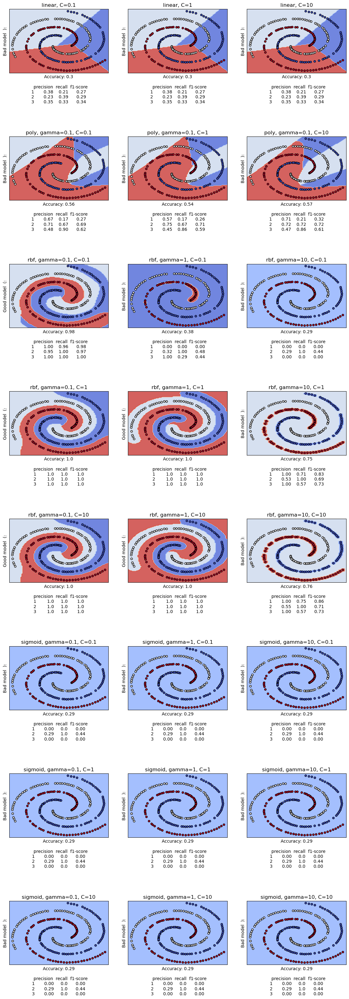

In [20]:
plot_graph_with_metrics(dataset)

Данные имеют сложное спирлевидное расположение. Только модель с ядром rbf смогла эффективно разделить их.

Вывод. 

Лучше всего себя показала модель с ядром rbf. Она умеет классифицировать не только линейно разделимые данные, вложенные, но и данные, структура которых весьма запутана и даже не сразу понятна. Однако стоит помнить, что модели с rbf ядрами зачастую требуют очень тонкой и точной настройки, что нельзя сказать, например, про модель с линейным ядром. Также модели с rbf ядром менее понятны и бывают очень затратными по времени при обучении. Таким образом, можно сделать вывод: там, где можно пользоваться моделями попроще (с линейным и полиномиальным ядром) стоит пользоваться именно ими. Там, где эти модели бессильны (например, данные имеют сложные нелинейные зависимости) в силу вступает модель с ядром rbf.

Объяснение значений параметром C и gamma в модели SVM.

Параметр C контролирует компромисс между максимизацией ширины разделяющей гиперплоскости и минимизацией классификационных ошибок на обучающих данных. Если C будет иметь высокое значение, то модель будет стремиться к минимизации ошибок на обучающем наборе, что может привести к переобучению, особенно если данные шумные. Если C будет иметь низкое значение, то модель будет более слабой и будет допускать больше ошибок на обучающих данных, что может помочь в обобщении, но увеличивает риск недообучения.

Параметр gamma определяет ширину гауссовского ядра, то есть контролирует влияние отдельных точек данных. Чем больше значение  gamma, тем больше влияние каждой отдельной точки на модель. При Ввсоком значении gamma модель будет более сложной и может подстраиваться под каждую точку, что также может привести к переобучению. При низком значении gamma модель будет более гладкой и обобщающей, что может помочь избежать переобучения, но также может привести к недообучению.

# SVM для задач регрессии

In [21]:
column_names = ['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT', 'MEDV']
dataset = pd.read_csv('datasets/housing.xls', header=None, delimiter=r"\s+", names=column_names)

In [22]:
dataset

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222.0,18.7,396.90,5.33,36.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.06263,0.0,11.93,0,0.573,6.593,69.1,2.4786,1,273.0,21.0,391.99,9.67,22.4
502,0.04527,0.0,11.93,0,0.573,6.120,76.7,2.2875,1,273.0,21.0,396.90,9.08,20.6
503,0.06076,0.0,11.93,0,0.573,6.976,91.0,2.1675,1,273.0,21.0,396.90,5.64,23.9
504,0.10959,0.0,11.93,0,0.573,6.794,89.3,2.3889,1,273.0,21.0,393.45,6.48,22.0


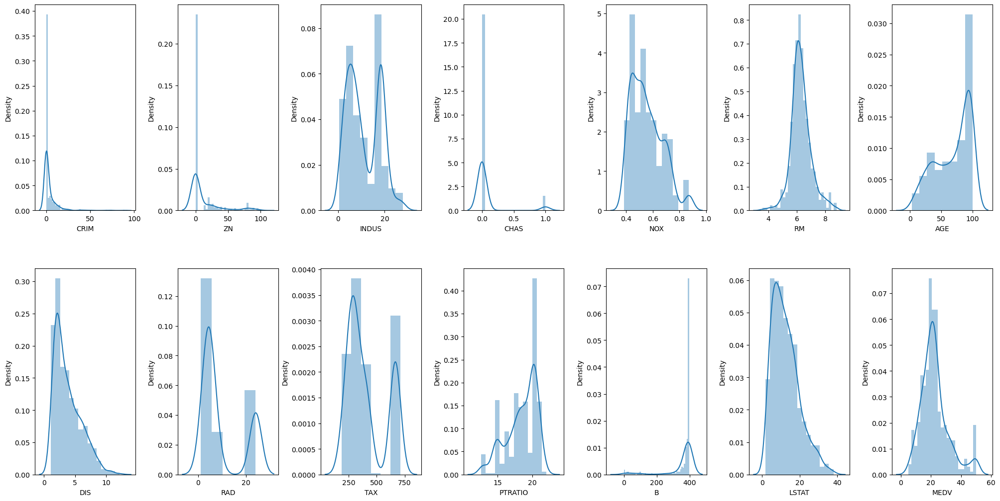

In [23]:
fig, axs = plt.subplots(ncols=7, nrows=2, figsize=(20, 10))
index = 0
axs = axs.flatten()
for k,v in dataset.items():
    sns.distplot(v, ax=axs[index])
    index += 1
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)

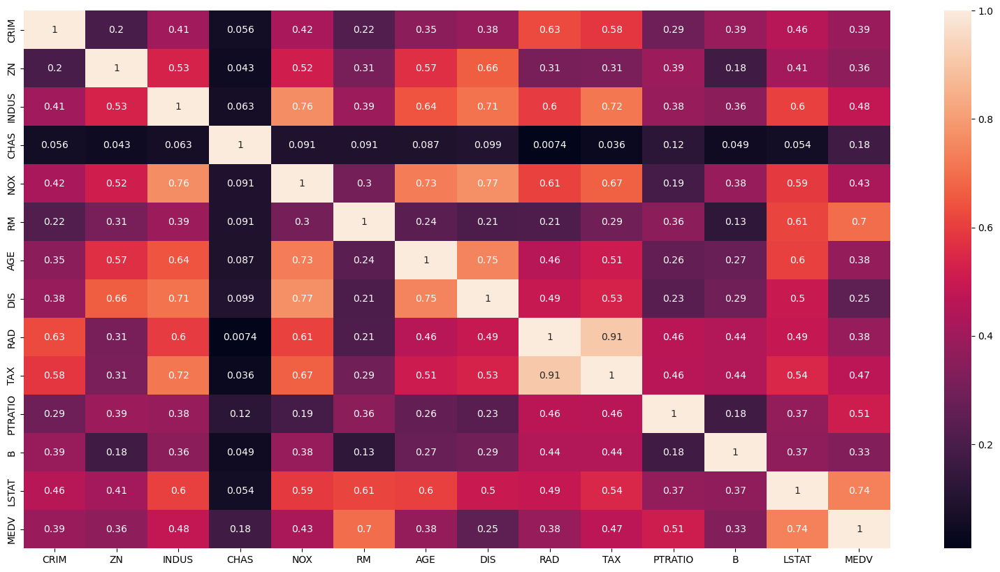

In [24]:
plt.figure(figsize=(20, 10))
sns.heatmap(dataset.corr().abs(),  annot=True);

In [52]:
min_max_scaler = preprocessing.MinMaxScaler()
column_sels = ['LSTAT', 'INDUS', 'NOX', 'PTRATIO', 'RM', 'TAX', 'DIS', 'AGE']
X = dataset.loc[:,column_sels]
y = dataset['MEDV']
X = pd.DataFrame(data=min_max_scaler.fit_transform(X), columns=column_sels)
X_scaled = min_max_scaler.fit_transform(X)

In [56]:
parameters = {'C':[0.1, 1, 10], 'gamma':[0.1, 1, 10]}
CV = GridSearchCV(SVR(), parameters, scoring='neg_mean_squared_error')
CV.fit(X_scaled, y)
print("Best classifier :", CV.best_params_)

Best classifier : {'C': 10, 'gamma': 1}
